<a href="https://colab.research.google.com/github/EliotAmado/Data-Science-Mini-Projects/blob/main/Checkpoint_Image_Processing_Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### READ ME

Use the code blocks below to answer each quiz question. Only print the output required for each question. Do not edit the comments at the top of each code cell. Otherwise, the auto-grader may misinterpret your results. See Question 0 as an an example of how to complete a task (leave it in your notebook; don't delete it):

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract
!pip install opencv-python


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [ ]:
# Question 1: Install the necesssary packages to use pytesseract. Download the zipped images
# folder attached. Unzip/decompress it and add it to Google Drive or some other location that allows you
# to access it from the .ipynb file template provided with this assignment. Iterate through the folder of
# images and extract the text from each image using pytesseract.

# Ignore or remove any tabs, extra (leading
# or trailing) spaces, and line breaks. Place the scrapped text and file name in a new DataFrame. Print
# out all 16 rows. In other words, include a row in the DataFrame for every file--even if it does not
# include any text.

import pytesseract
from pathlib import Path
import re
df = pd.DataFrame(columns=['File', 'Text'])
pathlist = Path('/content/drive/MyDrive/Data/images_homework (2)/images_homework').glob('*.*') #Since our path is a folder that contains images we use .glob to view those images. *.* means that it looks at/extracts anyything in that folder with a dot '.' in its name follwed by some characters (could be.jpg, .png, etc) you can also extract spefici .png, .jpg by doing something like : *.png
for path in pathlist: #for every image in pathlist...
  path_in_str = str(path) #converts path object(image) into string to be used by pytesseract
  text = pytesseract.image_to_string(path_in_str)
  cleaned_text = re.sub('\s+',' ',  text)
  try:
    df.loc[len(df)] = path_in_str, cleaned_text
    #print(f'{path_in_str}:\n{pytesseract.image_to_string(path_in_str)}') #extracts image and then text from the image using pytesseract
  except:
    df.loc[len(df)] = path_in_str, ''
    #print(f'{path_in_str}') #if there is an error attempting to extract text from image, exept acts like an error handler and extracts just image

# Note: you are welcome to install the packages in a prior code cell. Just make sure to delete the cell
# when you are done




In [ ]:
df

,File,Text
0,/content/drive/MyDrive/Data/images_homework (2...,5.
1,/content/drive/MyDrive/Data/images_homework (2...,
2,/content/drive/MyDrive/Data/images_homework (2...,
3,/content/drive/MyDrive/Data/images_homework (2...,
4,/content/drive/MyDrive/Data/images_homework (2...,
5,/content/drive/MyDrive/Data/images_homework (2...,
6,/content/drive/MyDrive/Data/images_homework (2...,
7,/content/drive/MyDrive/Data/images_homework (2...,LEARNING AT HOME DURING LOCKDOWN Top Tips to S...
8,/content/drive/MyDrive/Data/images_homework (2...,
9,/content/drive/MyDrive/Data/images_homework (2...,


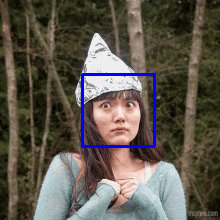

<built-in function id>: 1 faces


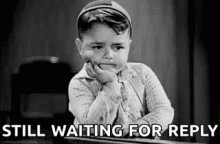

<built-in function id>: 0 faces


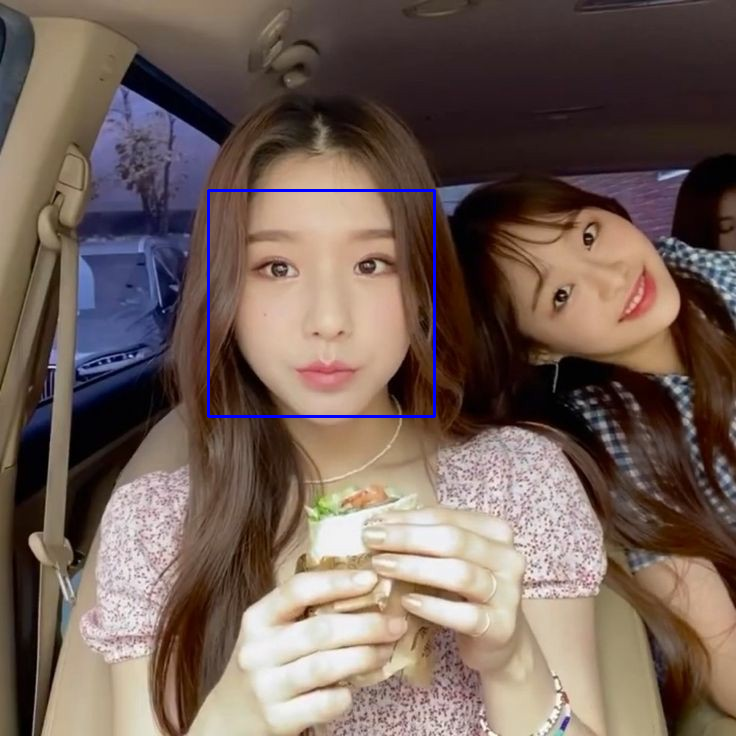

<built-in function id>: 1 faces


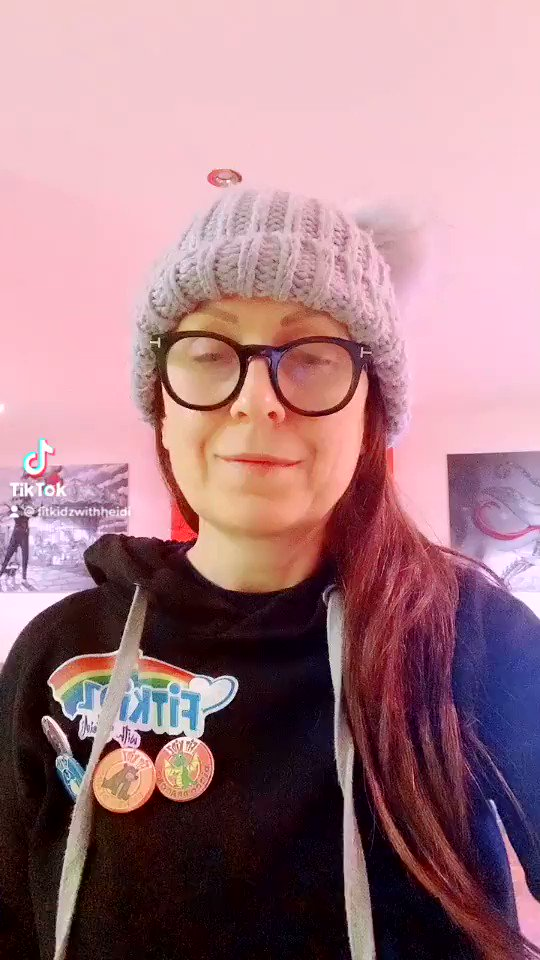

<built-in function id>: 0 faces


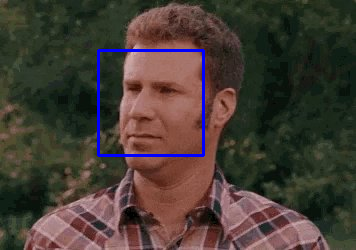

<built-in function id>: 1 faces


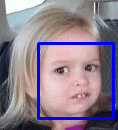

<built-in function id>: 1 faces


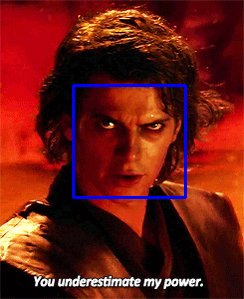

<built-in function id>: 1 faces


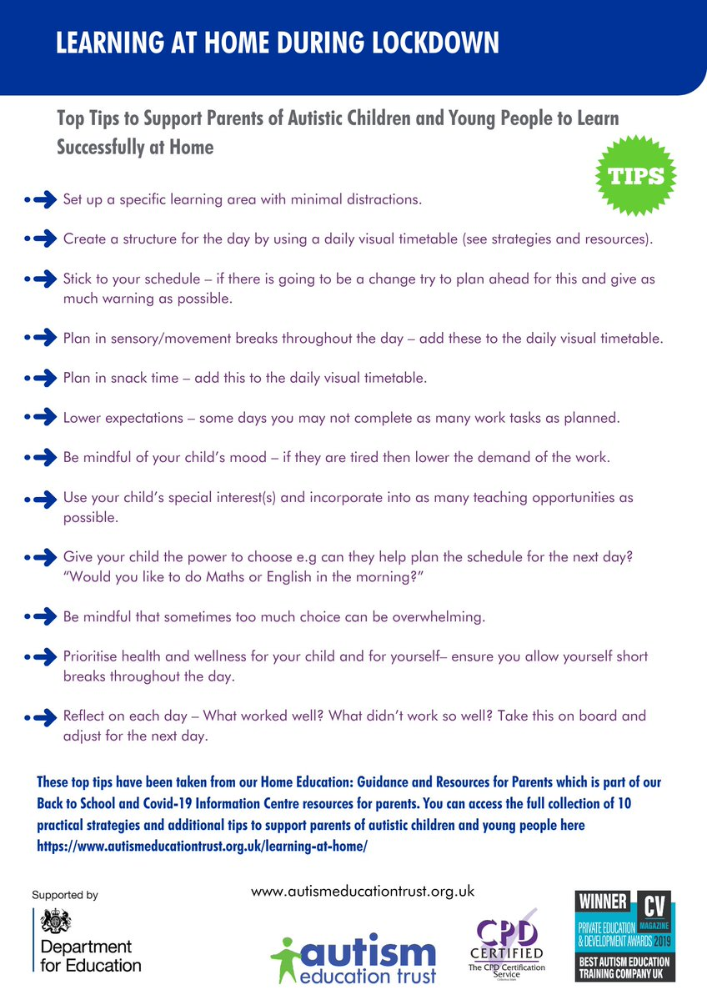

<built-in function id>: 0 faces


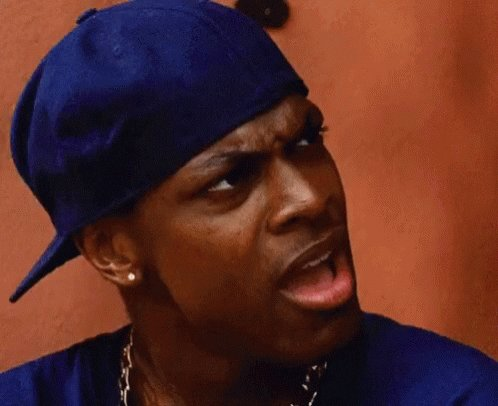

<built-in function id>: 0 faces


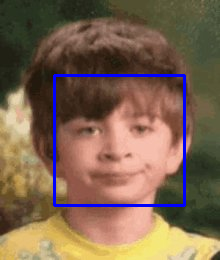

<built-in function id>: 1 faces


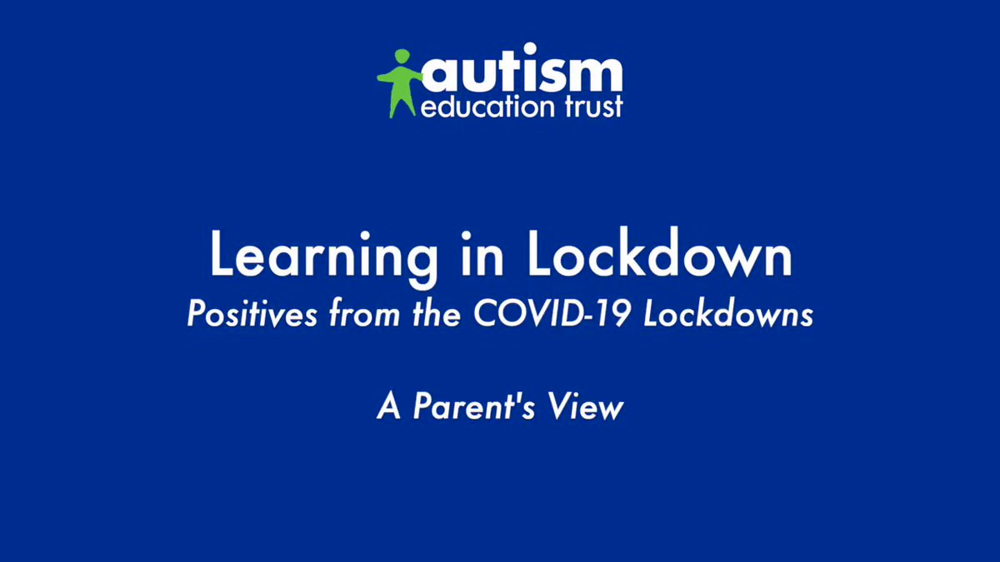

<built-in function id>: 0 faces


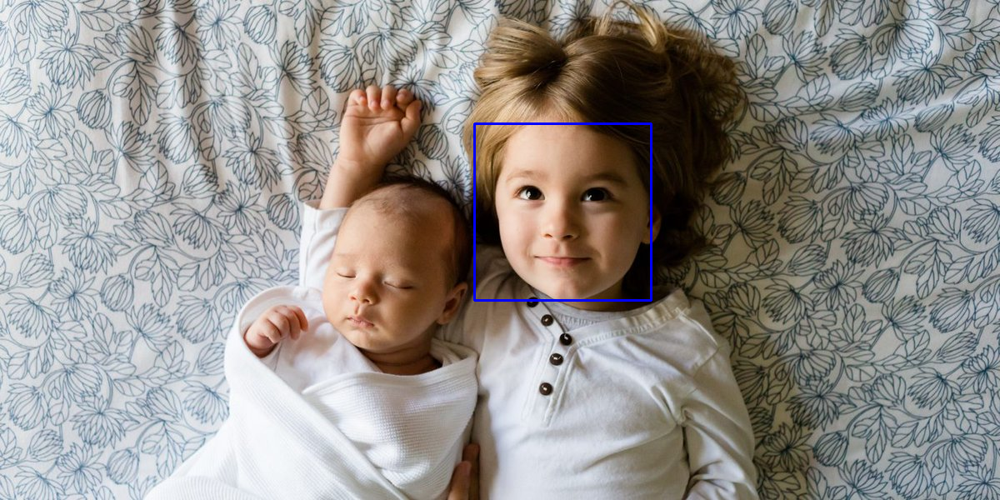

<built-in function id>: 1 faces


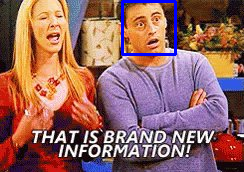

<built-in function id>: 1 faces


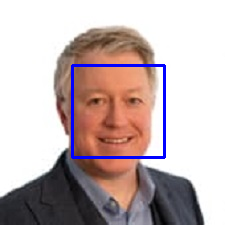

<built-in function id>: 1 faces


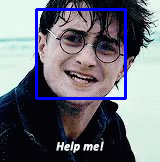

<built-in function id>: 1 faces


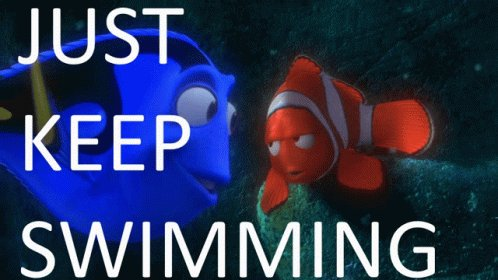

<built-in function id>: 0 faces


In [ ]:
# Question 2: Use the haarcascade_frontalface_default.xml file included with this assignment to detect
# faces within the 16 images. Add a column to the DataFrame created in the prior question that contains
# a count of the number of faces found in each image. Print out the entire DataFrame.
import cv2
from google.colab.patches import cv2_imshow
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/Data/haarcascade_frontalface_default (1).xml')
df['faces'] = 0
pathlist = Path('/content/drive/MyDrive/Data/images_homework (2)/images_homework').glob('*.*')
for i, path in enumerate(pathlist):
  if i > 16:
    break

  path_in_str = str(path)

  # Read the input image
  img = cv2.imread(path_in_str)

  # Convert into grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Detect faces
  faces = face_cascade.detectMultiScale(image=gray, scaleFactor=1.3, minNeighbors=5) #image is the image object being examined. scaleFactor refers to how much the image size is reduced ex: 1.3 means your image will be reduced by 30 percent increasing your chance of finding a matching size (resizing a larger face to a smaller one, making it more detectable by the algorithm). higher numbers will increase speed but risk missing some faces altogether. Good values are from 1.05 to 1.4. Kneighbors the number of neighbors each rectangle should have beside it (faces detected around it). a higher value results in fewer face detections, bu faces detected are higher quality and vice versa general range for good values is 3-6
  #count to detect the number of faces
  count = len(faces)
  df.loc[i, 'faces'] = count



  # Draw rectangle around the faces
  for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

  # Display the output
  try:
    cv2_imshow(img)

  except:
    cv2.imshow('img', img)
    cv2.waitKey()


  # status = cv2.imwrite('faces_detected.jpg', img) # We can save the images that have entities somewhere
  print(f"{id}: {len(faces)} faces")

In [ ]:
df

,File,Text,faces
0,/content/drive/MyDrive/Data/images_homework (2...,5.,1
1,/content/drive/MyDrive/Data/images_homework (2...,,0
2,/content/drive/MyDrive/Data/images_homework (2...,,1
3,/content/drive/MyDrive/Data/images_homework (2...,,0
4,/content/drive/MyDrive/Data/images_homework (2...,,1
5,/content/drive/MyDrive/Data/images_homework (2...,,1
6,/content/drive/MyDrive/Data/images_homework (2...,,1
7,/content/drive/MyDrive/Data/images_homework (2...,LEARNING AT HOME DURING LOCKDOWN Top Tips to S...,0
8,/content/drive/MyDrive/Data/images_homework (2...,,0
9,/content/drive/MyDrive/Data/images_homework (2...,,1


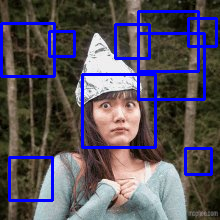

<built-in function id>: 9 faces


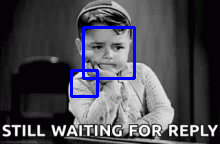

<built-in function id>: 2 faces


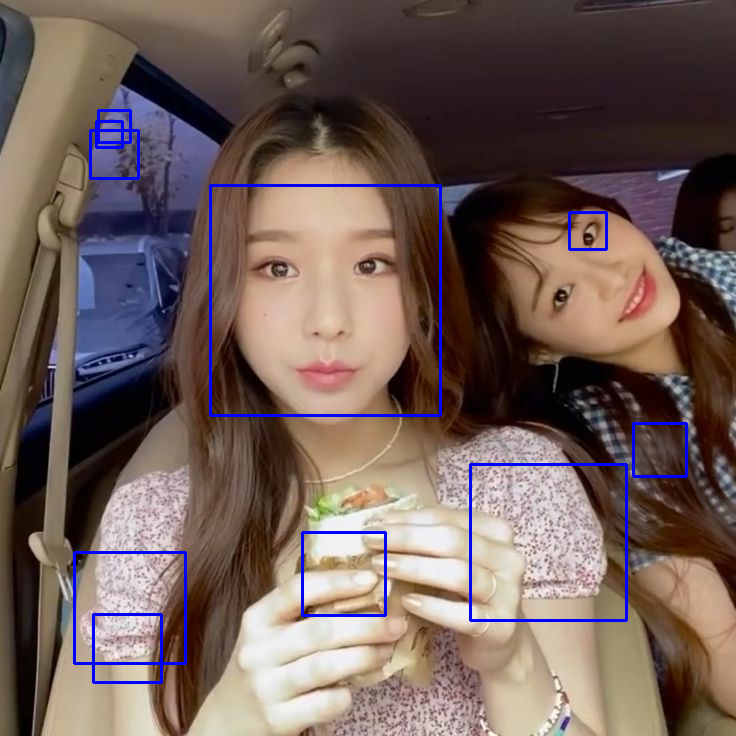

<built-in function id>: 10 faces


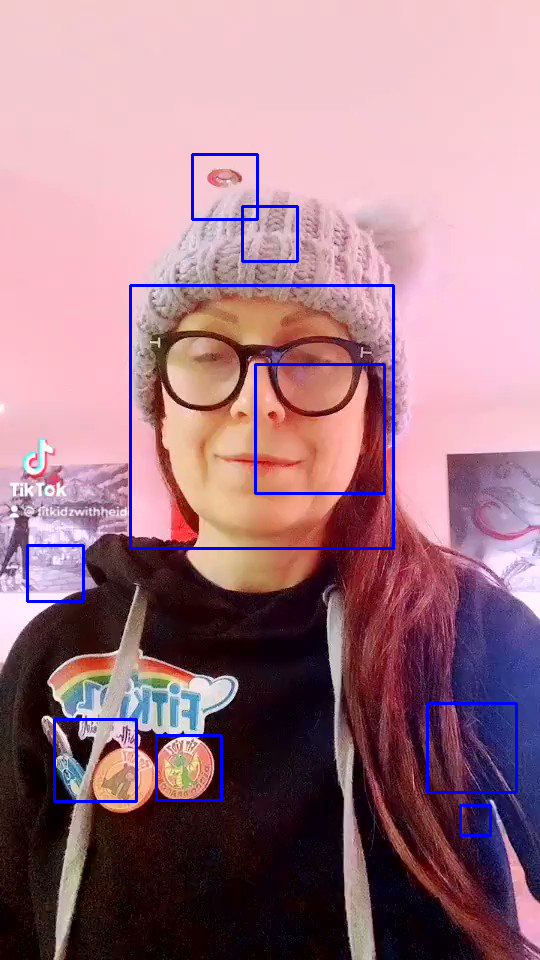

<built-in function id>: 9 faces


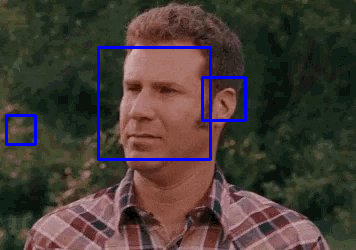

<built-in function id>: 3 faces


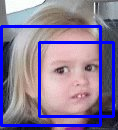

<built-in function id>: 2 faces


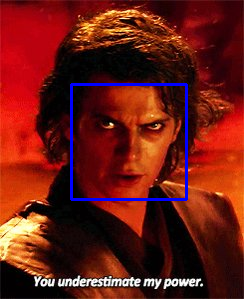

<built-in function id>: 1 faces


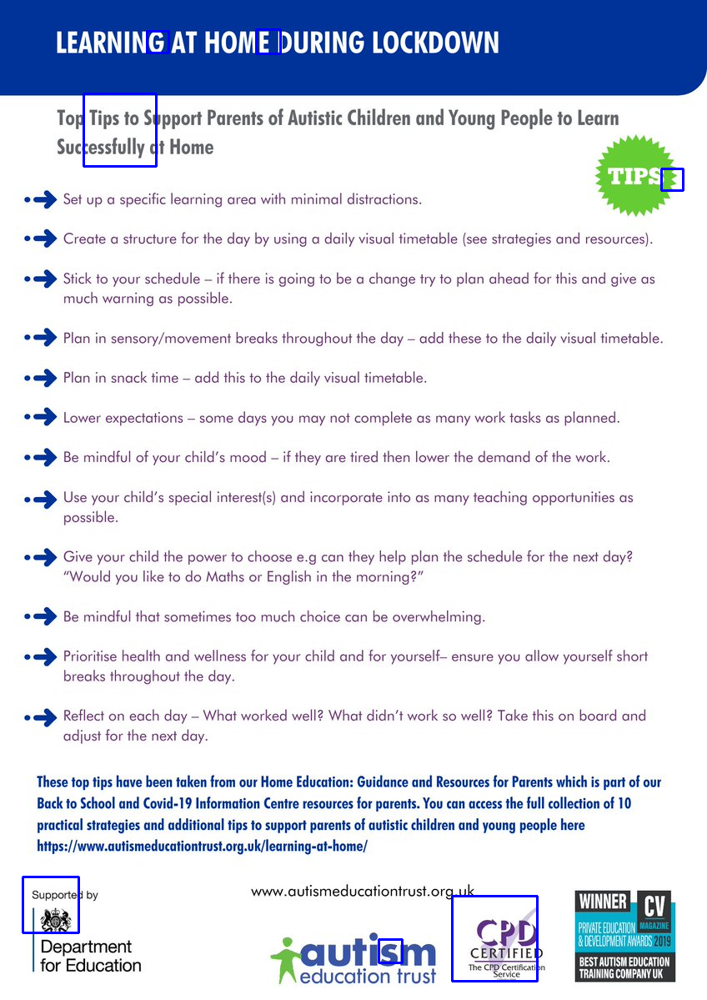

<built-in function id>: 7 faces


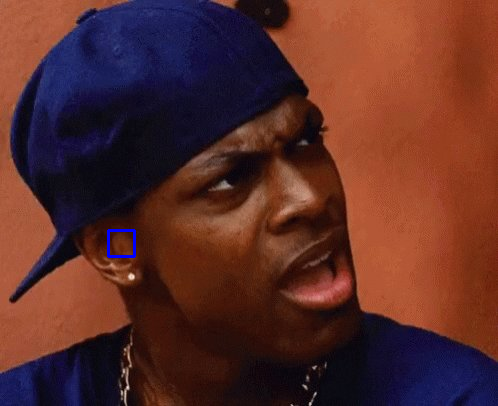

<built-in function id>: 1 faces


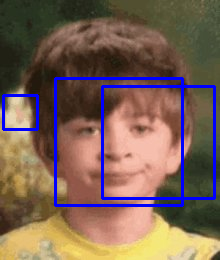

<built-in function id>: 3 faces


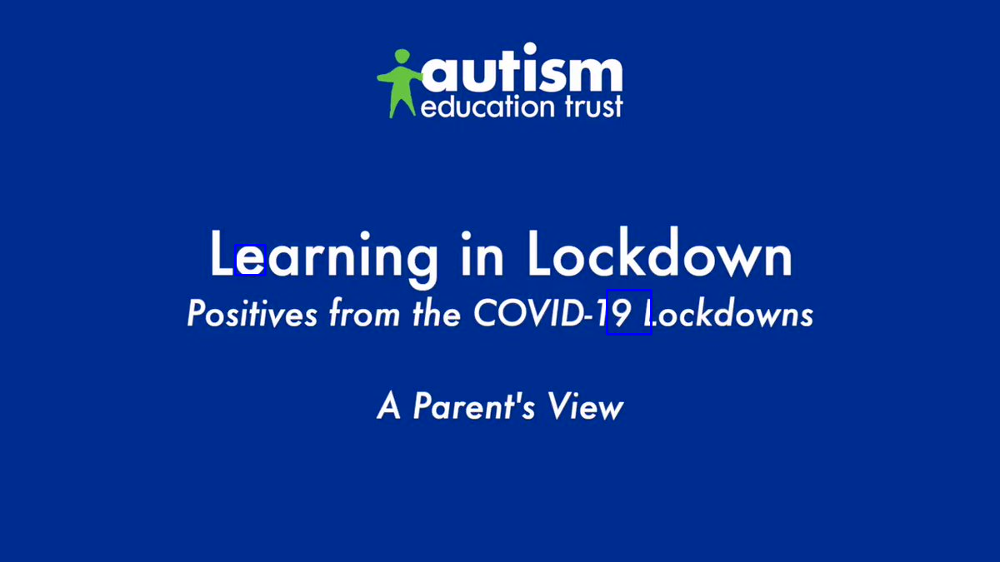

<built-in function id>: 2 faces


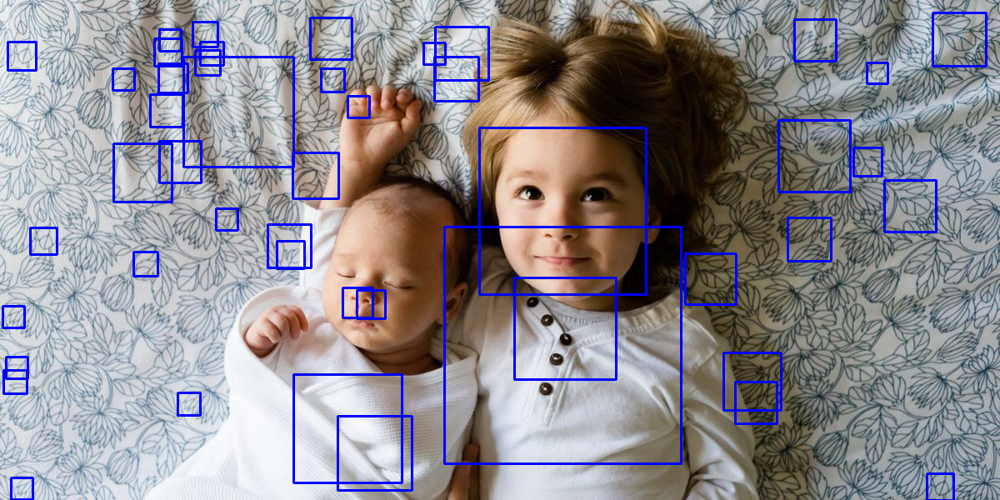

<built-in function id>: 47 faces


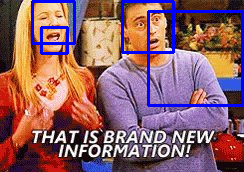

<built-in function id>: 4 faces


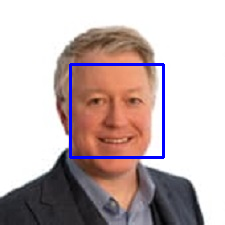

<built-in function id>: 1 faces


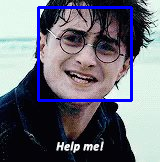

<built-in function id>: 1 faces


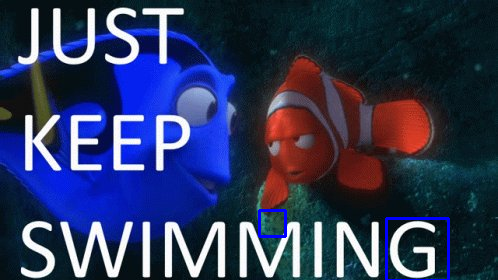

<built-in function id>: 2 faces


In [ ]:
# Question 3: Repeat the process in the prior step. But, adjust the scaleFactor to 1.01 and minNeighbors to 3.

face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/Data/haarcascade_frontalface_default (1).xml')
df['faces'] = 0
pathlist = Path('/content/drive/MyDrive/Data/images_homework (2)/images_homework').glob('*.*')
for i, path in enumerate(pathlist):
  if i > 16:
    break

  path_in_str = str(path)

  # Read the input image
  img = cv2.imread(path_in_str)

  # Convert into grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Detect faces
  faces = face_cascade.detectMultiScale(image=gray, scaleFactor=1.01, minNeighbors=3)
  #count to detect the number of faces
  count = len(faces)
  df.loc[i, 'faces'] = count



  # Draw rectangle around the faces
  for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

  # Display the output
  try:
    cv2_imshow(img)

  except:
    cv2.imshow('img', img)
    cv2.waitKey()


  # status = cv2.imwrite('faces_detected.jpg', img) # We can save the images that have entities somewhere
  print(f"{id}: {len(faces)} faces")

In [ ]:
Wrongly_Identified_faces = df['faces'].sum()
Total_Number_Of_Wrongly_Identified_Faces = Wrongly_Identified_faces - 13
Total_Number_Of_Wrongly_Identified_Faces

91

In [ ]:
df

,File,Text,faces
0,/content/drive/MyDrive/Data/images_homework (2...,5.,9
1,/content/drive/MyDrive/Data/images_homework (2...,,2
2,/content/drive/MyDrive/Data/images_homework (2...,,10
3,/content/drive/MyDrive/Data/images_homework (2...,,9
4,/content/drive/MyDrive/Data/images_homework (2...,,3
5,/content/drive/MyDrive/Data/images_homework (2...,,2
6,/content/drive/MyDrive/Data/images_homework (2...,,1
7,/content/drive/MyDrive/Data/images_homework (2...,LEARNING AT HOME DURING LOCKDOWN Top Tips to S...,7
8,/content/drive/MyDrive/Data/images_homework (2...,,1
9,/content/drive/MyDrive/Data/images_homework (2...,,3


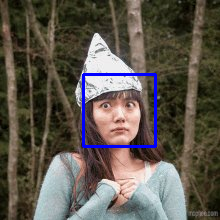

<built-in function id>: 1 faces


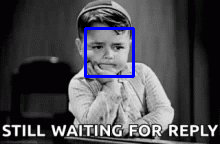

<built-in function id>: 1 faces


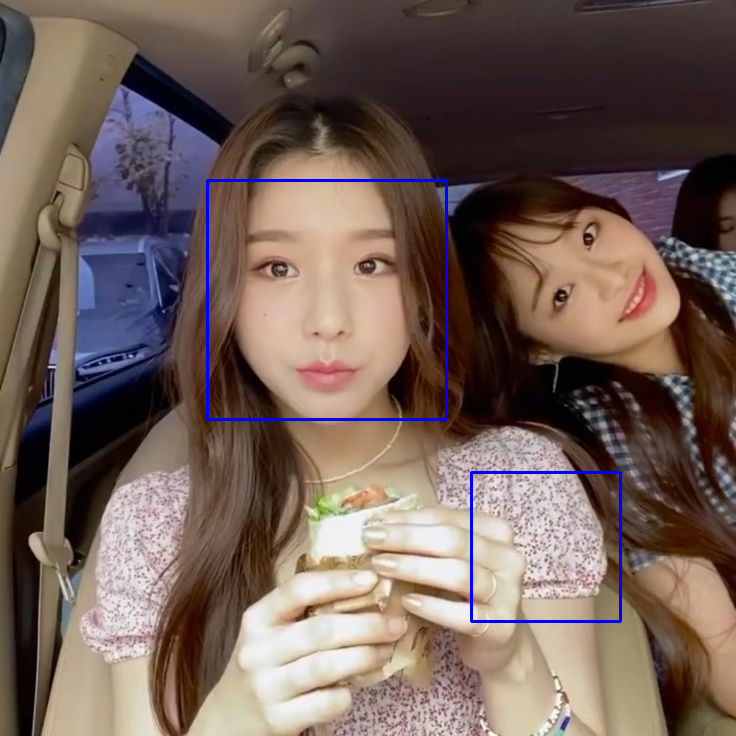

<built-in function id>: 2 faces


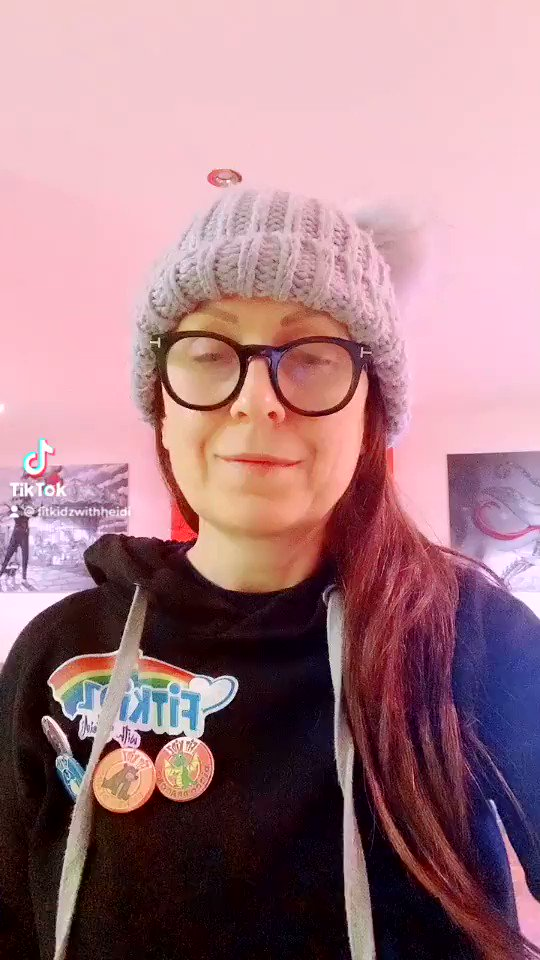

<built-in function id>: 0 faces


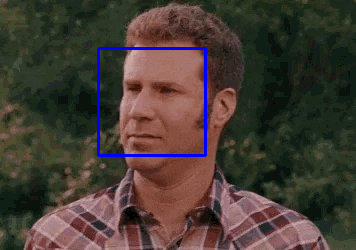

<built-in function id>: 1 faces


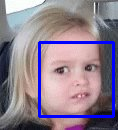

<built-in function id>: 1 faces


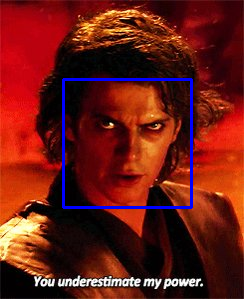

<built-in function id>: 1 faces


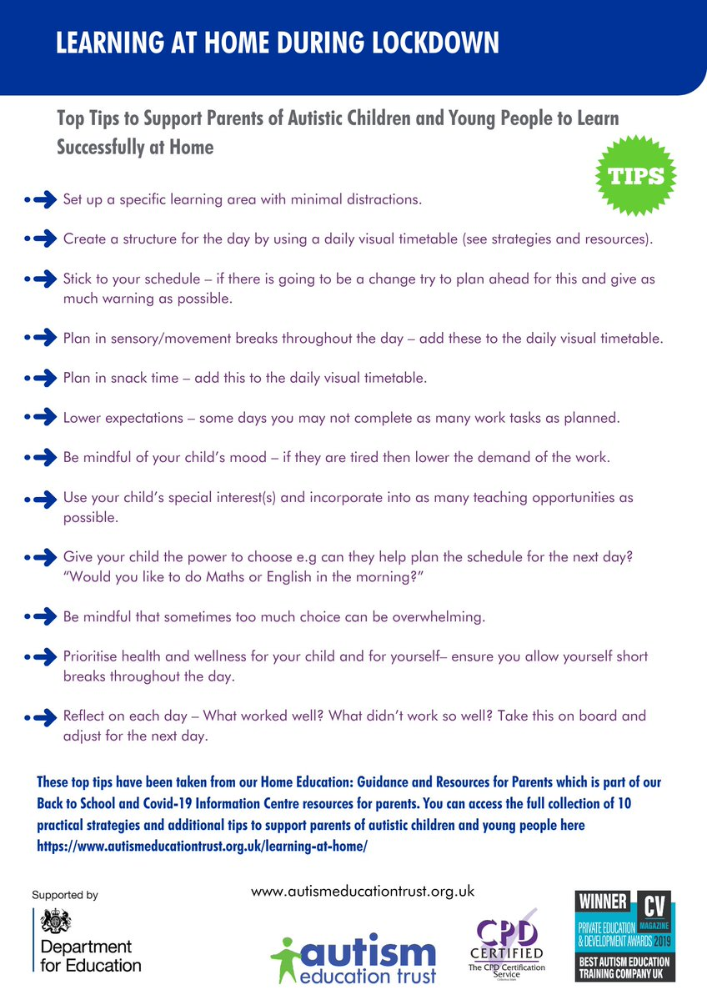

<built-in function id>: 0 faces


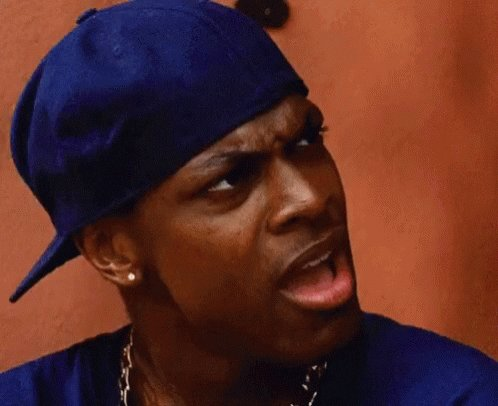

<built-in function id>: 0 faces


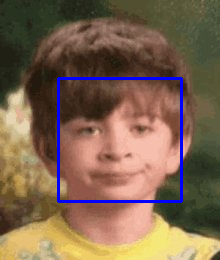

<built-in function id>: 1 faces


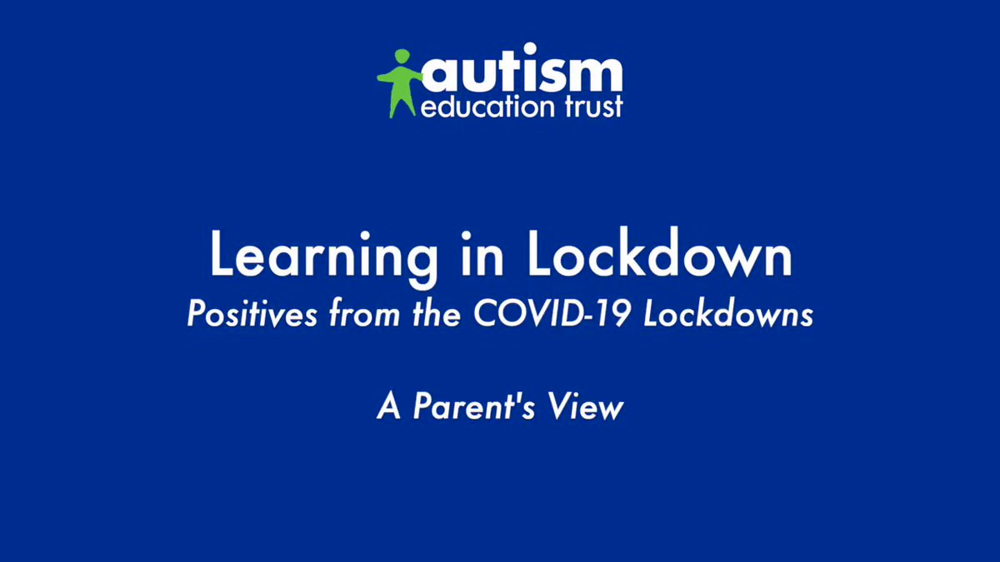

<built-in function id>: 0 faces


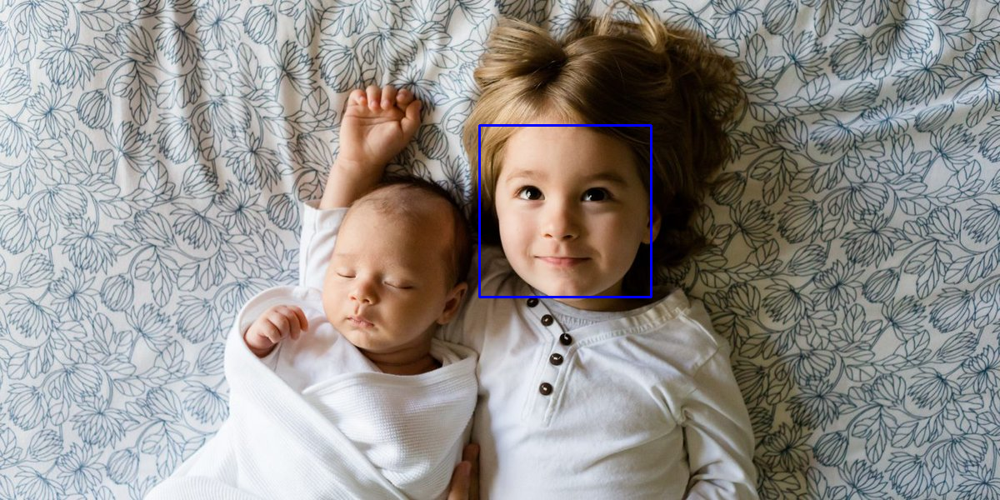

<built-in function id>: 1 faces


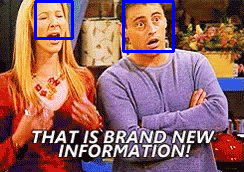

<built-in function id>: 2 faces


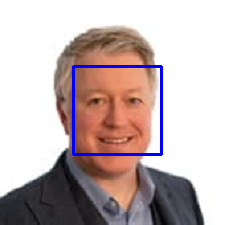

<built-in function id>: 1 faces


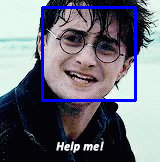

<built-in function id>: 1 faces


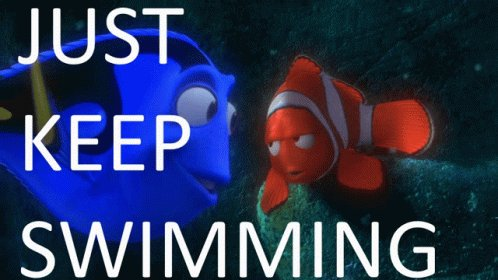

<built-in function id>: 0 faces


In [ ]:
# Question 4: Modify the scaleFactor and minNeighbors parameters to idenfity as true human faces as you can with
# as few misidentifications as you can. Print out the entire DataFrame including the column containing the number
# of faces identified in each image. Print all 16 rows.

face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/Data/haarcascade_frontalface_default (1).xml')
df['faces'] = 0
pathlist = Path('/content/drive/MyDrive/Data/images_homework (2)/images_homework').glob('*.*')
for i, path in enumerate(pathlist):
  if i > 16:
    break

  path_in_str = str(path)

  # Read the input image
  img = cv2.imread(path_in_str)

  # Convert into grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Detect faces
  faces = face_cascade.detectMultiScale(image=gray, scaleFactor=1.2, minNeighbors=3)
  #count to detect the number of faces
  count = len(faces)
  df.loc[i, 'faces'] = count



  # Draw rectangle around the faces
  for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

  # Display the output
  try:
    cv2_imshow(img)

  except:
    cv2.imshow('img', img)
    cv2.waitKey()


  # status = cv2.imwrite('faces_detected.jpg', img) # We can save the images that have entities somewhere
  print(f"{id}: {len(faces)} faces")


In [ ]:
Wrongly_Identified_faces = df['faces'].sum()
Total_Number_Of_Wrongly_Identified_Faces = Wrongly_Identified_faces - 13
Total_Number_Of_Wrongly_Identified_Faces

0